In [1]:
import selenium
from selenium import webdriver
import time
from skimage import io
import matplotlib.pyplot as plt
from urllib import error
import requests
import os
import pandas as pd
import numpy as np
import urllib.request
import cv2

In [103]:
DRIVER_PATH = "/Users/jsusser/Desktop/chromedriver"
wd = webdriver.Chrome(executable_path=DRIVER_PATH)

In [2]:
def split(x):
    line = []
    final = []
    num = 1
    for y in x.split(' '):
        line.append(y)
        if num/3 == int(num/3):
            final.append(' '.join(line))
            line = []
        num += 1
    final.append(' '.join(line))
    return '\n'.join(final)

In [140]:
def fetch_image_urls(query:str, max_links_to_fetch:int, wd:webdriver, manager:str, sleep_between_interactions:int=1):
    def scroll_to_end(wd):
        wd.execute_script("window.scrollTo(0, document.body.scrollHeight);")
        time.sleep(sleep_between_interactions)    
    search_url = "https://www.google.com/search?safe=off&site=&tbm=isch&source=hp&q={q}&oq={q}&gs_l=img"
    wd.get(search_url.format(q=query))
    image_urls = []
    scroll_to_end(wd)
    #print(wd.page_source)
    thumbnail_results = wd.find_elements_by_css_selector("img.Q4LuWd")
    number_results = len(thumbnail_results)
    p = 0
    a = wd.find_elements_by_css_selector("a.VFACy.kGQAp.sMi44c.lNHeqe.WGvvNb")
    global face_cascade
    while True:
        if len(thumbnail_results) == p:
            break
        if (p > 10 and len(image_urls) > 0) or p > 15:
            break
        i = a[p]
        img_real = thumbnail_results[p]
        img = img_real.get_attribute('src')
        alt = img_real.get_attribute('alt')
        txt = i.text
        href = i.get_attribute('href')
        print(txt)
        print(href)
        p += 1
        try: 
            imgURL = img
            path = "/Users/jsusser/Desktop/managers/{}/{}{}.jpg".format(manager,p,query)
            urllib.request.urlretrieve(imgURL, path)
            image = cv2.imread(path)
            faces = face_cascade.detectMultiScale(image, 1.1, 5)
            if len(faces) < 1 or len(faces) > 1:
                os.remove(path)
            else:
                check.loc[len(check)] = [manager,href, txt, alt, path]
                image_urls.append(img)
        except error.HTTPError as e:
            continue
        
    return image_urls

In [141]:
   %%javascript
    IPython.OutputArea.auto_scroll_threshold = 100

<IPython.core.display.Javascript object>

In [207]:
global check
global num

df = pd.read_csv("final_managers.csv", index_col=0)
num = 1
check = pd.DataFrame({}, columns=["manager","href", "href_text", "alt", "img"])
face_cascade = cv2.CascadeClassifier('/Users/jsusser/documents/cv2/haarcascade_frontalface_default.xml')
done = []
for x in os.listdir("/Users/jsusser/desktop/final_managers"):
    if x != ".DS_Store":
        done += [y for y in os.listdir("/Users/jsusser/desktop/final_managers/%s"%x)]
    
#none = pd.DataFrame({}, columns=["name","ticker", "manager"])
for index, instance in df.iterrows():
    num += 1
    equity = instance["Ticker"]
    manager = instance["Manager"]
    #pd.isna(manager)
    if "%s.jpg" % manager in done:
        continue
    if len(none[none["manager"] == manager]) > 0:
        continue
    if manager != manager or manager.split(' ')[0] == "#N/A":
        none.loc[len(none)] = [instance["Name_x"], instance["Ticker"], instance["Manager"]]
        continue
    if not manager in os.listdir("/Users/jsusser/Desktop/managers/"):
        os.mkdir("/Users/jsusser/Desktop/managers/{}".format(manager))
        
    print("\n\n---------------------\n\n\n\n",manager)
    img_urls = fetch_image_urls(equity+" "+manager,3,wd, manager)
    
    if len(img_urls) == 0:
        none.loc[len(none)] = [instance["Name_x"], instance["Ticker"], instance["Manager"]]
        
 
        



---------------------



 Jeff Ploshnick
STAW Officers
tradersmagazine.com
https://www.tradersmagazine.com/gallery/staw-officers/
Form 497 Access One Trust
streetinsider.com
https://www.streetinsider.com/SEC+Filings/Form+497+Access+One+Trust/14908870.html
Form 497 Access One Trust
streetinsider.com
https://www.streetinsider.com/SEC+Filings/Form+497+Access+One+Trust/14908870.html
Form 497 Access One Trust
streetinsider.com
https://www.streetinsider.com/SEC+Filings/Form+497+Access+One+Trust/14908870.html
S-1
sec.gov
https://www.sec.gov/Archives/edgar/data/1415311/000119312517296263/d464351ds1.htm
424B4
sec.gov
https://www.sec.gov/Archives/edgar/data/1415311/000119312512284070/d230073d424b4.htm
424B3
sec.gov
https://www.sec.gov/Archives/edgar/data/1415311/000119312519001619/d675562d424b3.htm
S-1
sec.gov
https://www.sec.gov/Archives/edgar/data/1415311/000119312518042589/d481415ds1.htm
424B5
sec.gov
https://www.sec.gov/Archives/edgar/data/1415311/000119312511256760/d230065d424b5.htm
S-1
s

485BPOS 1 fp0030423_485bpos.htm As
sec.gov
https://www.sec.gov/Archives/edgar/data/1026977/000101270918000010/fp0030423_485bpos.htm
485BPOS 1 fp0030423_485bpos.htm As
sec.gov
https://www.sec.gov/Archives/edgar/data/1026977/000101270918000010/fp0030423_485bpos.htm
fp0010734_497.htm
sec.gov
https://www.sec.gov/Archives/edgar/data/1026977/000139834414003248/fp0010734_497.htm
485BPOS 1 fp0030423_485bpos.htm As
sec.gov
https://www.sec.gov/Archives/edgar/data/1026977/000101270918000010/fp0030423_485bpos.htm
497 1 fp0019484_497.htm PROSPECTUS
sec.gov
https://www.sec.gov/Archives/edgar/data/1026977/000139834416013079/fp0019484_497.htm
George Goudelias - Biography
virtus.com
https://www.virtus.com/assets/files/1sd/goudelias_biographies.pdf
485BPOS 1 fp0030423_485bpos.htm As
sec.gov
https://www.sec.gov/Archives/edgar/data/1026977/000101270918000010/fp0030423_485bpos.htm
497 1 fp0019484_497.htm PROSPECTUS
sec.gov
https://www.sec.gov/Archives/edgar/data/1026977/000139834416013079/fp0019484_497.htm

fp0010734_497.htm
sec.gov
https://www.sec.gov/Archives/edgar/data/1026977/000139834414003248/fp0010734_497.htm
UNITED STATES SECURITIES AND EXCHANGE ...
sec.gov
https://www.sec.gov/Archives/edgar/data/1026977/000139834415008134/fp0016952_ncsr.htm
UNITED STATES SECURITIES AND EXCHANGE ...
sec.gov
https://www.sec.gov/Archives/edgar/data/1026977/000139834415008134/fp0016952_ncsr.htm
fp0008826_ncsr.htm
sec.gov
https://www.sec.gov/Archives/edgar/data/1026977/000139834413005775/fp0008826_ncsr.htm
fp0008826_ncsr.htm
sec.gov
https://www.sec.gov/Archives/edgar/data/1026977/000139834413005775/fp0008826_ncsr.htm
UNITED STATES SECURITIES AND EXCHANGE ...
sec.gov
https://www.sec.gov/Archives/edgar/data/1026977/000139834415008134/fp0016952_ncsr.htm
fp0010734_497.htm
sec.gov
https://www.sec.gov/Archives/edgar/data/1026977/000139834414003248/fp0010734_497.htm
fp0010734_497.htm
sec.gov
https://www.sec.gov/Archives/edgar/data/1026977/000139834414003248/fp0010734_497.htm


---------------------



 Graha

AIM INVESTMENT SECURITIES FUNDS ...
fintel.io
https://fintel.io/doc/sec-aim-investment-securities-funds-invesco-investment-securities-funds-invesco-oppenheimer-limited-term-government-fund-class-c-ncsr-2019-may-09-18394-189
In Focus
invesco.com
https://www.invesco.com/us-rest/contentdetail?contentId=39b660c704225710VgnVCM1000006e36b50aRCRD&dnsName=us&title=further-enhancing-our-ability-to-deliver-strong-investment-outcomes-to-our-valued-clients
Your Retirement Workbook
micatholic.org
http://www.micatholic.org/assets/files/services/403b/PrudentialRetirementWorkbook.pdf
Archives for 2012 | Mutual Fund ...
mutualfundobserver.com
https://www.mutualfundobserver.com/2012/page/2/
Calamos Hires Ex-Janus CEO | Morningstar
morningstar.com
https://www.morningstar.com/articles/565710/calamos-hires-ex-janus-ceo


---------------------



 Jeffrey Clarke
Lazard US Corporate Income Portfolio ...
lazardassetmanagement.com
https://www.lazardassetmanagement.com/us/en_us/funds/mutual-funds/lazard-us-corp

Sean Feeley Net Worth (2020) | wallmine
wallmine.com
https://wallmine.com/people/70712/sean-feeley
Barings Global Credit Income ...
barings.com
https://www.barings.com/us/guest/funds/mutual-funds/barings-global-credit-income-opportunities-fund
Barings Funds Trust 2019 Securities ...
sec.report
https://sec.report/Document/0001104659-19-056980/
Civil engineers ready for a bumper year ...
march.afrc.af.mil
https://www.march.afrc.af.mil/News/Article-Display/Article/167948/civil-engineers-ready-for-a-bumper-year-of-renovations/
Barings Funds Trust 2019 Securities ...
sec.report
https://sec.report/Document/0001104659-19-056980/
Corinne Feeley | Hunt Scanlon Media
huntscanlon.com
https://huntscanlon.com/recruiter/corinne-feeley/


---------------------



 Craig C Dembek
Prospectus
sec.gov
https://www.sec.gov/Archives/edgar/data/778108/000120677419002216/mimeqiv3559562-497c.htm
Prospectus
sec.gov
https://www.sec.gov/Archives/edgar/data/778108/000120677419002216/mimeqiv3559562-497c.htm
Delawar

AB High Income Fund
sec.gov
https://www.sec.gov/Archives/edgar/data/915845/000119312516444746/d13052d497k.htm
SUP AB BOND FUNDS -AB - PDF Free Download
docplayer.net
https://docplayer.net/19588902-Sup-0115-0216-ab-bond-funds-ab.html
AB High Income Fund
alliancebernstein.com
https://www.alliancebernstein.com/sites/investments/us/research-portal/content/fixed-income/taxable/high-income/sample-rfi/2018.pdf
INVESTMENT OBJECTIVE The Fund s ...
docplayer.net
https://docplayer.net/21762142-Investment-objective-the-fund-s-investment-objective-is-to-seek-to-maximize-total-returns-from-price-appreciation-and-income.html
SUP AB BOND FUNDS -AB - PDF Free Download
docplayer.net
https://docplayer.net/19588902-Sup-0115-0216-ab-bond-funds-ab.html


---------------------



 Andrew Susser
MainStay High Yield Corporate Bond Fund
advisorselect.com
https://www.advisorselect.com/transcript/tickerfunds/q-a-with-andrew-susser-mainstay-high-yield-corporate-bond-fund
Finding Opportunity in High-Yield Bonds ...

Archives for 2013 | Mutual Fund ...
mutualfundobserver.com
https://www.mutualfundobserver.com/2013/page/2/


---------------------



 Michael Weaver
Fidelity® Focused High Income Fund
fidelity.com
https://www.fidelity.com/bin-public/060_www_fidelity_com/documents/SHDOCS/FHIFX/hosts/sh_comm_pmqa.001366.RETAIL_pdf.pdf
High Income Fund | Fidelity Investments
fundresearch.fidelity.com
https://fundresearch.fidelity.com/mutual-funds/analysis/316146794
High Income Fund | Fidelity Investments
fundresearch.fidelity.com
https://fundresearch.fidelity.com/mutual-funds/analysis/316146794
And the No. 1 Stock-Fund Manager Is… - WSJ
wsj.com
https://www.wsj.com/articles/and-the-no-1-stock-fund-manager-is-11554689520
And the No. 1 Stock-Fund Manager Is… - WSJ
wsj.com
https://www.wsj.com/articles/and-the-no-1-stock-fund-manager-is-11554689520
Fidelity® Focused High Income Fund ...
institutional.fidelity.com
https://institutional.fidelity.com/app/proxy/content?literatureURL=/B-CFFH-SUM.PDF
Fidelity® Focu



---------------------



 Daniel Deyoung
INEAX | Columbia High Yield Bond Fund ...
columbiathreadneedleus.com
https://www.columbiathreadneedleus.com/investment-products/mutual-funds/Columbia-High-Yield-Bond-Fund/Class-A/details/?cusip=19766F274
Columbia Funds Series Trust
sec.gov
https://www.sec.gov/Archives/edgar/data/1097519/000119312519205264/d766947d485bpos.htm
10 Funds Get Downgraded in February ...
morningstar.com
https://www.morningstar.com/articles/918741/10-funds-get-downgraded-in-february
Front Range BidCo Inc Bond
fintel.io
https://fintel.io/so/us/98919vaa3
Is VWEHX a Strong Bond Fund Right Now?
finance.yahoo.com
https://finance.yahoo.com/news/vwehx-strong-bond-fund-now-110011075.html
28618MAA4 Institutional Ownership ...
fintel.io
https://fintel.io/so/us/28618maa4
Columbia Funds Series Trust
sec.gov
https://www.sec.gov/Archives/edgar/data/1097519/000119312516525078/d153314d485apos.htm
Columbia Funds Series Trust II
sec.gov
https://www.sec.gov/Archives/edgar/data/1352280/0

VOYA Funds Trust
sec.gov
https://www.sec.gov/Archives/edgar/data/1066602/000119312514157448/d715495d497.htm
VOYA Funds Trust
sec.gov
https://www.sec.gov/Archives/edgar/data/1066602/000119312514157448/d715495d497.htm
voya funds trust
sec.gov
https://www.sec.gov/Archives/edgar/data/1066602/000110465918035917/a18-14290_1485apos.htm
Voya Funds Trust, Inc.
sec.gov
https://www.sec.gov/Archives/edgar/data/1066602/000119312515206392/d933064d485apos.htm
Voya Separate Portfolios Trust
sec.gov
https://www.sec.gov/Archives/edgar/data/1392116/000119312515271140/d11225d497.htm
Voya Funds Trust, Inc.
sec.gov
https://www.sec.gov/Archives/edgar/data/1066602/000119312515206392/d933064d485apos.htm
Funds Fact Book
individuals.voya.com
https://individuals.voya.com/document/fund-fact-book/voya-funds-fact-book.pdf


---------------------



 Bill Adams
A SUMMARY FOR THE NORTH DAKOTA PUBLIC ...
legis.nd.gov
http://www.legis.nd.gov/files/committees/63-2013nma/appendices/15_5157_03000appendixf.pdf
A SUMMARY FOR

Timothy Plan® | High Yield Bond - TPHAX ...
timothyplan.com
https://timothyplan.com/our-funds/summary-hyb.php
Timothy Plan® | High Yield Bond - TPHAX ...
timothyplan.com
https://timothyplan.com/our-funds/summary-hyb.php
Timothy Plan® | High Yield Bond - TPHAX ...
timothyplan.com
https://timothyplan.com/our-funds/summary-hyb.php
Timothy Plan® | High Yield Bond - TPHAX ...
timothyplan.com
https://timothyplan.com/our-funds/summary-hyb.php
Timothy Plan® | High Yield Bond - TPHAX ...
timothyplan.com
https://timothyplan.com/our-funds/summary-hyb.php
Timothy Plan® | High Yield Bond - TPHAX ...
timothyplan.com
https://timothyplan.com/our-funds/summary-hyb.php
Timothy Plan® | High Yield Bond - TPHAX ...
timothyplan.com
https://timothyplan.com/our-funds/summary-hyb.php
Timothy Plan Family of Funds
sec.gov
https://www.sec.gov/Archives/edgar/data/916490/000119312507097822/dn1aa.htm
Timothy Plan A&amp;C Shares
sec.gov
https://www.sec.gov/Archives/edgar/data/916490/000119312520022687/d841659d497.htm

485BPOS 1 c87268_485bpos.htm As
sec.gov
https://www.sec.gov/Archives/edgar/data/906352/000093041317001484/c87268_485bpos.htm
Semi-Annual Report
materials.proxyvote.com
https://materials.proxyvote.com/default.aspx?docHostID=135510
485BPOS 1 c87268_485bpos.htm As
sec.gov
https://www.sec.gov/Archives/edgar/data/906352/000093041317001484/c87268_485bpos.htm
first eagle funds
sec.gov
https://www.sec.gov/Archives/edgar/data/906352/000093041317000321/c87268_485apos.htm
485BPOS 1 c92705_485bpos.htm As
sec.gov
https://www.sec.gov/Archives/edgar/data/906352/000093041319000757/c92705_485bpos.htm
485BPOS 1 c92705_485bpos.htm As
sec.gov
https://www.sec.gov/Archives/edgar/data/906352/000093041319000757/c92705_485bpos.htm


---------------------



 Ian Spreadbury
Fidelity ® Global High Income Fund ...
fundresearch.fidelity.com
https://fundresearch.fidelity.com/mutual-funds/view-all/31641Q854
Fidelity's Ian Spreadbury to retire
investmentweek.co.uk
https://www.investmentweek.co.uk/investment-week/news

German politicians just got hacked | PNU
publicnewsupdate.com
https://publicnewsupdate.com/vox-sentences-a-ton-of-german-politicians-just-got-hacked/


---------------------



 Chris Kocinski
Neuberger Berman
nb.com
https://www.nb.com/en/fi/biographies/christopher-kocinski
Neuberger Berman
nb.com
https://www.nb.com/en/fi/biographies/christopher-kocinski
Neuberger Berman
nb.com
https://www.nb.com/en/fi/biographies/christopher-kocinski
Neuberger Berman
nb.com
https://www.nb.com/en/fi/biographies/christopher-kocinski
Neuberger Berman
nb.com
https://www.nb.com/en/fi/biographies/christopher-kocinski
Neuberger Berman
nb.com
https://www.nb.com/en/fi/biographies/christopher-kocinski
High Income Bond Fund | Neuberger Berman
nb.com
https://www.nb.com/en/us/products/mutual-funds/high-income-bond-fund
Christopher Kocinski: Candidate profile
dailyherald.com
https://www.dailyherald.com/news/20190314/christopher-kocinski-candidate-profile
High Income Bond Fund | Neuberger Berman
nb.com
https://www.n

Virtus Newfleet High Yield Fund ...
virtus.com
https://www.virtus.com/products/newfleet-high-yield
Virtus Newfleet High Yield Fund ...
virtus.com
https://www.virtus.com/products/newfleet-high-yield
Virtus Newfleet High Yield Fund ...
virtus.com
https://www.virtus.com/products/newfleet-high-yield
Virtus Newfleet High Yield Fund ...
virtus.com
https://www.virtus.com/products/newfleet-high-yield
VIRTUS OPPORTUNITIES TRUST
virtus.com
https://www.virtus.com/assets/files/t7/8008_aopportunitiestrust.pdf
The Home Depot Eric Paul Hess ...
coursehero.com
https://www.coursehero.com/file/49490341/Hess-Wk3pptx/
Eric Hess - Global Operations ...
linkedin.com
https://www.linkedin.com/in/eric-hess-7077397
The Home Depot Eric Paul Hess ...
coursehero.com
https://www.coursehero.com/file/49490341/Hess-Wk3pptx/
The Home Depot Eric Paul Hess ...
coursehero.com
https://www.coursehero.com/file/49490341/Hess-Wk3pptx/
The Home Depot Eric Paul Hess ...
coursehero.com
https://www.coursehero.com/file/49490341/Hes

High Yield Corporate Bond ETF ETF
fintel.io
https://fintel.io/so/us/hyg
BP Institutional Ownership - BP Plc Stock
fintel.io
https://fintel.io/so/us/bp
LUMN Institutional Ownership ...
fintel.io
https://fintel.io/so/us/lumn
VZ Institutional Ownership - Verizon ...
fintel.io
https://fintel.io/so/us/vz
Las Vegas Sands Corp ...
fintel.io
https://fintel.io/so/us/lvs
LyondellBasell Industries NV ...
fintel.io
https://fintel.io/so/us/lyb
Is USHYX a Strong Bond Fund Right Now?
ca.sports.yahoo.com
https://ca.sports.yahoo.com/news/ushyx-strong-bond-fund-now-110011758.html
JNJ Institutional Ownership - Johnson ...
fintel.io
https://fintel.io/so/us/jnj%201%20c135
T Institutional Ownership - AT & T, Inc ...
fintel.io
https://fintel.io/so/us/t
CVS Institutional Ownership - CVS ...
fintel.io
https://fintel.io/so/us/cvs
ABBV Institutional Ownership - AbbVie ...
fintel.io
https://fintel.io/so/us/abbv
Summary Prospectus
content.usaa.com
https://content.usaa.com/mcontent/static_assets/Media/mf_summary_pr

PFI 1031 485B 2017 Combined Document
sec.gov
https://www.sec.gov/Archives/edgar/data/898745/000089874517000181/pfi1031485b2017filingbody.htm
Institutional Class Shares Prospectus ...
principal.com
https://www.principal.com/allweb/docs/ris/investments/prospectus/1/fv199.pdf
Prospectus
principal.com
https://www.principal.com/allweb/docs/ris/investments/prospectus/1/fv208a.pdf


---------------------



 Richard J Lindquist
Richard J. Lindquist | Fund Manager ...
citywireselector.com
https://citywireselector.com/manager/richard-j-lindquist/d13348
Plymouth County Retirement Association
pcr-ma.org
https://www.pcr-ma.org/sites/default/files/fileattachments/general/page/2251/february_26_meeting_materials.pdf
Morgan Stanley Institutional Fund Trust ...
sec.report
https://sec.report/Document/0001104659-14-005624/
Morgan Stanley Institutional Fund Trust ...
sec.report
https://sec.report/Document/0001104659-14-005624/
Plymouth County Retirement Association
pcr-ma.org
https://www.pcr-ma.org/sites/

J. Chris Jones – 8
hvllc.com
https://www.hvllc.com/staff/j-chris-jones/
J. Chris Jones Net Worth (2020) | wallmine
wallmine.com
https://wallmine.com/nasdaq/nuze/officer/1882234/j-chris-jones
Chris Jones - Vice President ...
linkedin.com
https://www.linkedin.com/in/chris-jones-2858656
Chris Jones - Vice President ...
linkedin.com
https://www.linkedin.com/in/chris-jones-2858656
Chris Jones - New York, New York ...
linkedin.com
https://www.linkedin.com/in/chris-jones-53959a90
Christopher Jones ...
reuters.com
https://www.reuters.com/article/blackrock-cio/blackrock-hires-jpmorgans-christopher-jones-to-head-americas-equity-unit-idUKL3N0ME3WN20140317
H1- Is Chris Jones going to hold out (0 ...
omny.fm
https://omny.fm/shows/the-program/h1-is-chris-jones-going-to-hold-out-0-00-29-34-bil


---------------------



 Peter Schwab
Pax High Yield Bond Fund | High Yield ...
impaxam.com
https://impaxam.com/products/fixed-income/high-yield-bond-strategy/pax-high-yield-bond-fund/
Award Winning Pax SVP 

Improving Housing Market ...
video.foxbusiness.com
https://video.foxbusiness.com/v/2109735449001/


---------------------



 Berkin Kologlu
Angel Oak High Yield Opportunities Fund ...
advisorselect.com
http://www.advisorselect.com/transcript/AngelOakCapitalAdvisors/angel-oak-high-yield-opportunities-fund-fact-sheet-december-31-2016
Angel Oak High Yield Opportunities Fund ...
advisorselect.com
http://www.advisorselect.com/transcript/AngelOakCapitalAdvisors/angel-oak-high-yield-opportunities-fund-fact-sheet-december-31-2016
Angel Oak High Yield Opportunities Fund
angeloakcapital.com
https://angeloakcapital.com/wp-content/uploads/2020/2Q/high_yield_opportunities_fund_2Q20.pdf
Document
sec.gov
https://www.sec.gov/Archives/edgar/data/1612930/000089418919003421/angeloakhighyieldopportuni.htm
Angel Oak Funds Trust 2020 Securities ...
sec.report
https://sec.report/Document/0000894189-20-004215/
Archives for 2017 | Mutual Fund ...
mutualfundobserver.com
https://www.mutualfundobserver.com/2017/

Nuveen Credit Income Fund
documents.nuveen.com
https://documents.nuveen.com/Documents/Nuveen/Viewer.aspx?uniqueId=691a4907-9863-4bb6-96e2-2999c41b30a0


---------------------



 Aashh Parekh
Aashh K Parekh | Nuveen
nuveen.com
https://www.nuveen.com/en-us/people/profiles/p/aashh-parekh
Nuveen Credit Income Fund | Mutual Fund ...
nuveen.com
https://www.nuveen.com/mutual-funds/nuveen-credit-income-fund
Nuveen Credit Income Fund | Mutual Fund ...
nuveen.com
https://www.nuveen.com/mutual-funds/nuveen-credit-income-fund
Nuveen Credit Income Fund | Mutual Fund ...
nuveen.com
https://www.nuveen.com/mutual-funds/nuveen-credit-income-fund
Nuveen Credit Income Fund | Mutual Fund ...
nuveen.com
https://www.nuveen.com/mutual-funds/nuveen-credit-income-fund
Nuveen Credit Income Fund | Mutual Fund ...
nuveen.com
https://www.nuveen.com/mutual-funds/nuveen-credit-income-fund
Aashh Parekh Net Worth (2020) | wallmine
wallmine.com
https://wallmine.com/people/115022/aashh-parekh
Nuveen Credit Income Fund 

PGIM Investments expands active ETF ...
businesswire.com
https://www.businesswire.com/news/home/20180927005534/en/PGIM-Investments-expands-active-ETF-platform-with-the-launch-of-a-new-high-yield-bond-fund
PGIM Fixed Income announces leadership ...
businesswire.com
https://www.businesswire.com/news/home/20180405005159/en/PGIM-Fixed-Income-announces-leadership-changes-to-its-US-bank-loan-team
Robert Cignarella, CFA
pgim.com
https://www.pgim.com/fixed-income/biography/robert-cignarella-cfa
485BPOS 1 pip15bpos.htm As
sec.gov
https://www.sec.gov/Archives/edgar/data/278187/000006759016002654/pip15bpos.htm
485BPOS 1 pip15bpos.htm As
sec.gov
https://www.sec.gov/Archives/edgar/data/278187/000006759016002654/pip15bpos.htm
Fixed Income & Credit: High-yield ...
ipe.com
https://www.ipe.com/strategies/fixed-income-and-credit-high-yield-worries-grow/10044483.article
Form 485BPOS PRUDENTIAL INVESTMENT
streetinsider.com
https://www.streetinsider.com/SEC+Filings/Form+485BPOS+PRUDENTIAL+INVESTMENT/160590

As filed with the U.S. Securities and ...
sec.gov
https://www.sec.gov/Archives/edgar/data/939934/000110465917059740/a17-18802_1485bpos.htm


---------------------



 Anup Agarwal
HC CAPITAL TRUST
sec.gov
https://www.sec.gov/Archives/edgar/data/934563/000119312517270383/d430317d485apos.htm
HC CAPITAL TRUST
sec.gov
https://www.sec.gov/Archives/edgar/data/934563/000119312517270383/d430317d485apos.htm
HC CAPITAL TRUST
sec.gov
https://www.sec.gov/Archives/edgar/data/934563/000119312517270383/d430317d485apos.htm
HC CAPITAL TRUST
sec.gov
https://www.sec.gov/Archives/edgar/data/934563/000119312517270383/d430317d485apos.htm
HC Capital Trust
sec.gov
https://www.sec.gov/Archives/edgar/data/934563/000119312517322873/d448872d485bpos.htm
HC Capital Trust
sec.gov
https://www.sec.gov/Archives/edgar/data/934563/000119312517322873/d448872d485bpos.htm
HC Capital Trust
sec.gov
https://www.sec.gov/Archives/edgar/data/934563/000119312517322873/d448872d485bpos.htm
HC Capital Trust
sec.gov
https://www.sec.go

HC Capital Trust
sec.gov
https://www.sec.gov/Archives/edgar/data/934563/000119312517322873/d448872d485bpos.htm
JPMorgan Equity Income Fund-I | J.P ...
am.jpmorgan.com
https://am.jpmorgan.com/us/en/asset-management/gim/adv/products/d/jpmorgan-equity-income-fund-i-4812c0498
HC Capital Trust
sec.gov
https://www.sec.gov/Archives/edgar/data/934563/000119312513430114/d623684d497.htm
HC Capital Trust
sec.gov
https://www.sec.gov/Archives/edgar/data/934563/000119312517322873/d448872d485bpos.htm
HC Capital Trust
sec.gov
https://www.sec.gov/Archives/edgar/data/934563/000119312517322873/d448872d485bpos.htm
HC CAPITAL TRUST
sec.gov
https://www.sec.gov/Archives/edgar/data/934563/000119312517270383/d430317d485apos.htm
HC CAPITAL TRUST
sec.gov
https://www.sec.gov/Archives/edgar/data/934563/000119312517270383/d430317d485apos.htm
HC Capital Trust
sec.gov
https://www.sec.gov/Archives/edgar/data/934563/000119312517322873/d448872d485bpos.htm


---------------------



 Manuel Hayes
Manuel Hayes | Mellon In

Hc Capital Trust 2020 Investment ...
sec.report
https://sec.report/Document/0001193125-20-131185/


---------------------



 Justin Henne
Justin Henne | Parametric Portfolio
parametricportfolio.com
https://www.parametricportfolio.com/about/our-people/justin-henne
Hc Capital Trust 2020 Investment ...
sec.report
https://sec.report/Document/0001193125-20-131185/
Hc Capital Trust 2020 Investment ...
sec.report
https://sec.report/Document/0001193125-20-131185/
Hc Capital Trust 2020 Investment ...
sec.report
https://sec.report/Document/0001193125-20-131185/
Hc Capital Trust 2020 Investment ...
sec.report
https://sec.report/Document/0001193125-20-131185/
Hc Capital Trust 2020 Investment ...
sec.report
https://sec.report/Document/0001193125-20-131185/
HC CAPITAL TRUST
sec.gov
https://www.sec.gov/Archives/edgar/data/934563/000119312517270383/d430317d485apos.htm
Hc Capital Trust 2020 Investment ...
sec.report
https://sec.report/Document/0001193125-20-131185/
HC CAPITAL TRUST
sec.gov
https://www

Franklin High Income Fund - FHAIX
franklintempleton.com
https://www.franklintempleton.com/investor/investments-and-solutions/investment-options/mutual-funds/overview/105/franklin-high-income-fund/FHAIX
Franklin High Income Fund - FVHIX
franklintempleton.com
https://www.franklintempleton.com/investor/investments-and-solutions/investment-options/mutual-funds/overview/605/franklin-high-income-fund/FVHIX
Franklin High Income Fund - FHAIX
franklintempleton.com
https://www.franklintempleton.com/investor/investments-and-solutions/investment-options/mutual-funds/overview/105/franklin-high-income-fund/FHAIX
Franklin High Income Fund - FHAIX
franklintempleton.com
https://www.franklintempleton.com/investor/investments-and-solutions/investment-options/mutual-funds/overview/105/franklin-high-income-fund/FHAIX
Franklin High Income A1 (FHAIX) Quote ...
morningstar.com
https://www.morningstar.com/funds/xnas/fhaix/quote
FRANKLIN HIGH INCOME TRUST - 497 ...
fintel.io
https://fintel.io/doc/sec-fhaix-fran

The Bellaire Buzz - October 2020 by The ...
issuu.com
https://issuu.com/thebuzzmagazines/docs/buzz_bell_oct20
Liquidity Measurement Problems in Fast ...
onlinelibrary.wiley.com
https://onlinelibrary.wiley.com/doi/abs/10.1111/jofi.12127
The Memorial Buzz - October 2020 by The ...
issuu.com
https://issuu.com/thebuzzmagazines/docs/buzz_mem_oct20
2009 Grantor's Listing
state.nj.us
http://www.state.nj.us/treasury/taxation/pdf/lpt/stat_data/2010/non_usable/ocean.pdf


---------------------



 Bryan Petermann
The US High Yield Market Paradox
muzinich.com
https://www.muzinich.com/wp-content/uploads/US-HY-Market-Paradox-1017.pdf
485BPOS - - MUZINICH 485BPOS ...
fintel.io
https://fintel.io/doc/sec-mzfrx-muzinich-high-income-floating-rate-fund-485bpos-2020-april-30-18383-613
485BPOS - - MUZINICH 485BPOS ...
fintel.io
https://fintel.io/doc/sec-mzfrx-muzinich-high-income-floating-rate-fund-485bpos-2020-april-30-18383-613
485BPOS - - MUZINICH 485BPOS ...
fintel.io
https://fintel.io/doc/sec-mzfrx-mu

Tony Ng - Prime Trading Services - 瑞士 ...
hk.linkedin.com
https://hk.linkedin.com/in/tony-ng-96491b9b
Tony Ng - Prime Trading Services - 瑞士 ...
hk.linkedin.com
https://hk.linkedin.com/in/tony-ng-96491b9b
Bear 1.25X Fund 497K ...
fintel.io
https://fintel.io/doc/sec-dxnsx-direxion-monthly-nasdaq-100-bear-1-25x-fund-497k-2019-december-27-18323
Tony Ng - Prime Trading Services - 瑞士 ...
hk.linkedin.com
https://hk.linkedin.com/in/tony-ng-96491b9b
Tony Ng - Prime Trading Services - 瑞士 ...
hk.linkedin.com
https://hk.linkedin.com/in/tony-ng-96491b9b


---------------------



 Craig P Russ
Craig P. Russ | Fund Manager Fact Sheet ...
citywireselector.com
https://citywireselector.com/manager/craig-p-russ/d20420
Ira Russ - Senior Security Manager ...
linkedin.com
https://www.linkedin.com/in/ira-russ


In [206]:
len(none[~none["manager"].isnull()])

82

In [9]:
check.to_csv("check.csv")
none.to_csv("none.csv")
#remove.to_csv("remove.csv")
link.to_csv("link.csv")

In [3]:
check = pd.read_csv("check2.csv", index_col=0)
none = pd.read_csv("none.csv", index_col=0)
df = pd.read_csv("final_managers.csv", index_col=0)


In [4]:
link = pd.read_csv("link.csv", index_col=0)

In [5]:
    %%javascript
    IPython.OutputArea.auto_scroll_threshold = 9999

<IPython.core.display.Javascript object>

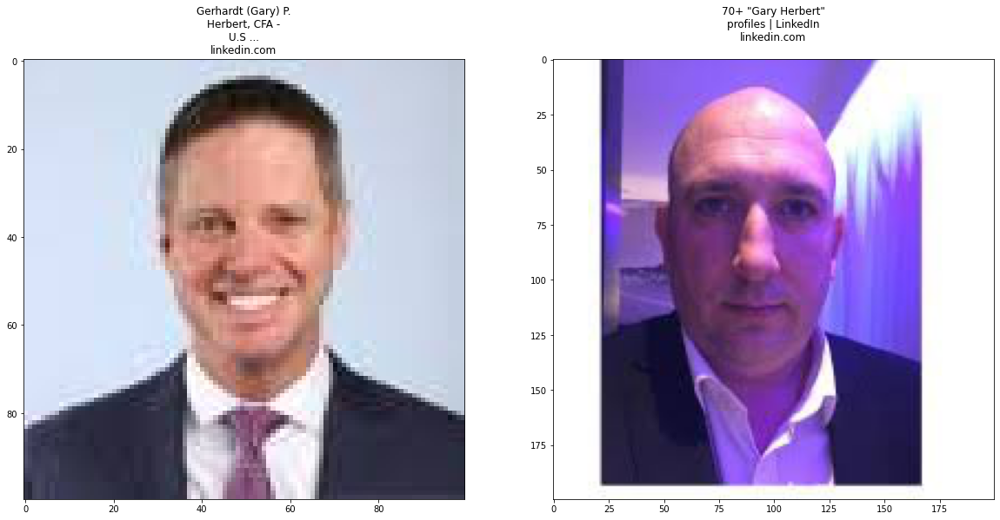

----------------------

 Gerhardt P Herbert "Gary"
LMZIX US equity
https://www.linkedin.com/in/gerhardt-gary-p-herbert-cfa-0b7b0a123
https://www.linkedin.com/pub/dir/Gary/Herbert
n


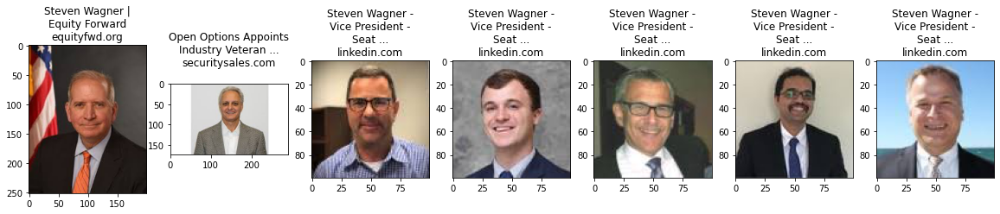

----------------------

 Steven Wagner
FHIIX US equity
https://equityfwd.org/steven-wagner
https://www.securitysales.com/business/people/open-options-steve-wagner-president/
https://www.linkedin.com/in/stevewagneroperations
https://www.linkedin.com/in/stevewagneroperations
https://www.linkedin.com/in/stevewagneroperations
https://www.linkedin.com/in/stevewagneroperations
https://www.linkedin.com/in/stevewagneroperations
n


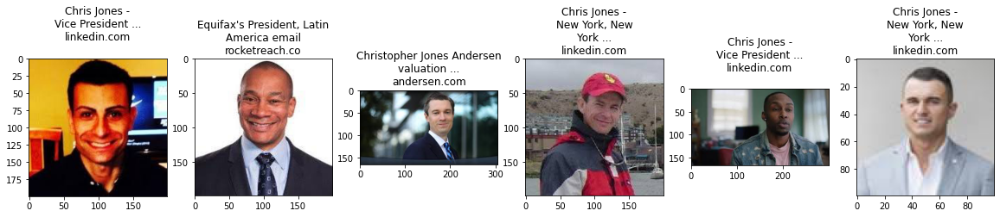

----------------------

 Chris Jones
HAHAX US equity
https://www.linkedin.com/in/chris-jones-2858656
https://rocketreach.co/chris-jones-email_10753265
https://andersen.com/people/jones-chris
https://www.linkedin.com/in/chris-jones-61040
https://www.linkedin.com/in/chris-jones-2858656
https://www.linkedin.com/in/chris-jones-53959a90
n


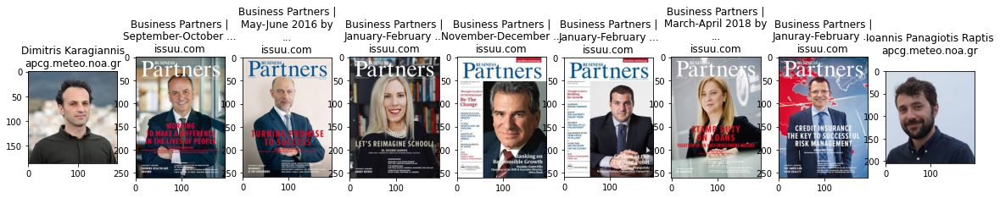

----------------------

 Evangelos Karagiannis
PHYSX US equity
http://apcg.meteo.noa.gr/index.php/people/93-dimitris-karagiannis
https://issuu.com/rmpp/docs/bp92
https://issuu.com/rmpp/docs/bp_may-jun_16
https://issuu.com/rmpp/docs/bp_jan-feb_17
https://issuu.com/rmpp/docs/bp_nov-dec_12
https://issuu.com/rmpp/docs/bp_jan-feb_16
https://issuu.com/rmpp/docs/bp95
https://issuu.com/rmpp/docs/bp94
http://apcg.meteo.noa.gr/index.php/people/42-ioannis-panagiotis-raptis
n


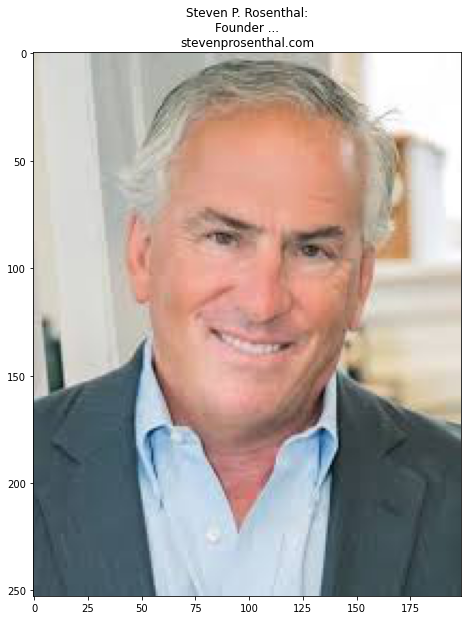

----------------------

 Steven Rosenthal
PHDYX US equity
http://stevenprosenthal.com/
n


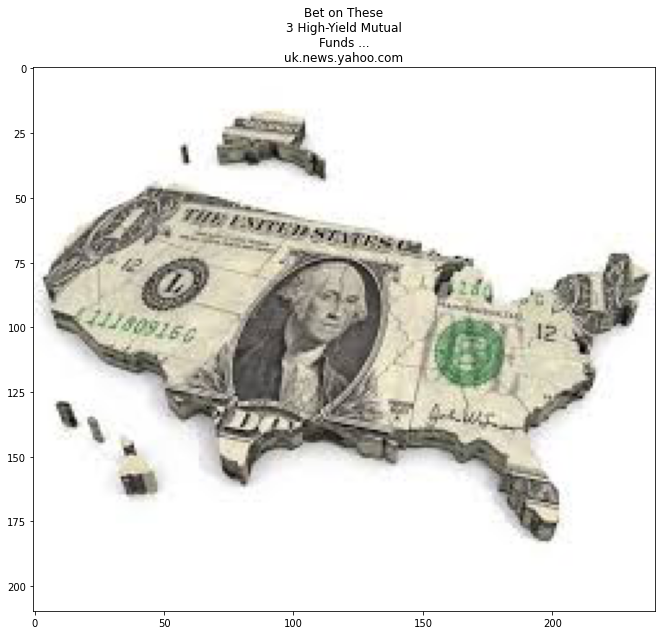

----------------------

 Fred Hoff
FSHNX US equity
https://uk.news.yahoo.com/bet-3-high-yield-mutual-121912096.html
n


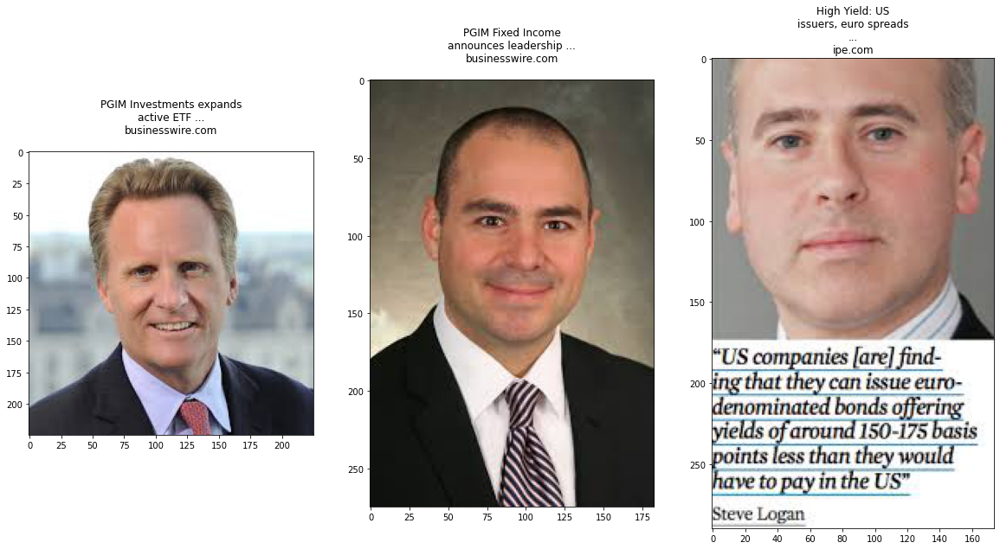

----------------------

 Robert Cignarella
PBHAX US equity
https://www.businesswire.com/news/home/20180927005534/en/PGIM-Investments-expands-active-ETF-platform-with-the-launch-of-a-new-high-yield-bond-fund
https://www.businesswire.com/news/home/20180405005159/en/PGIM-Fixed-Income-announces-leadership-changes-to-its-US-bank-loan-team
https://www.ipe.com/high-yield-us-issuers-euro-spreads/10007314.article
n


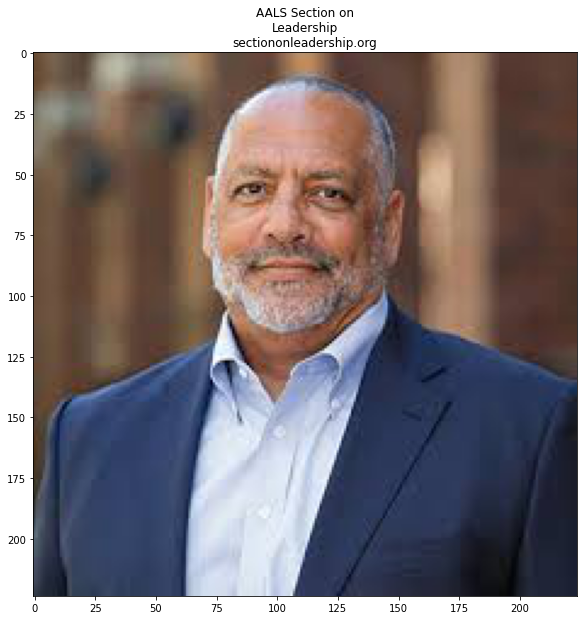

----------------------

 Daniel Thorogood
PBHAX US equity
https://sectiononleadership.org/
n


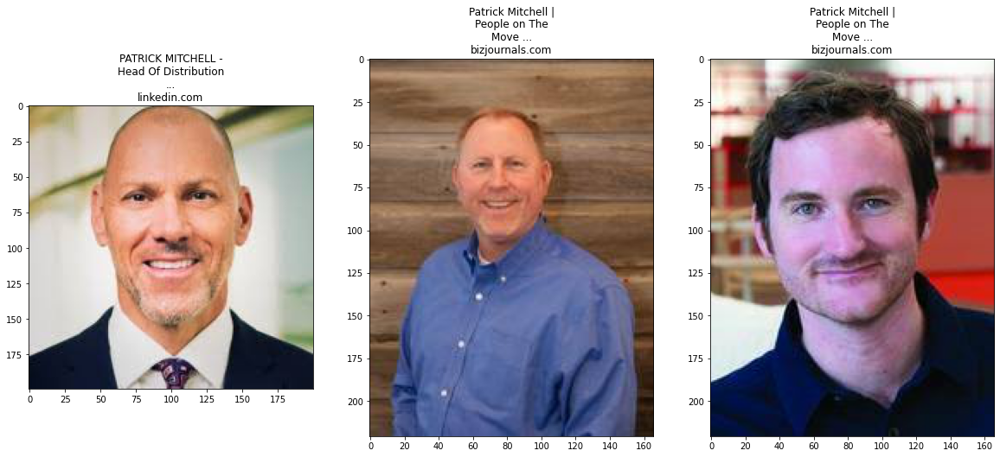

----------------------

 Patrick Mitchell
SGYAX US equity
https://www.linkedin.com/in/patrickjmitchell
https://www.bizjournals.com/sanfrancisco/potmsearch/detail/submission/6464392/Patrick_Mitchell
https://www.bizjournals.com/sanfrancisco/potmsearch/detail/submission/6464392/Patrick_Mitchell
n


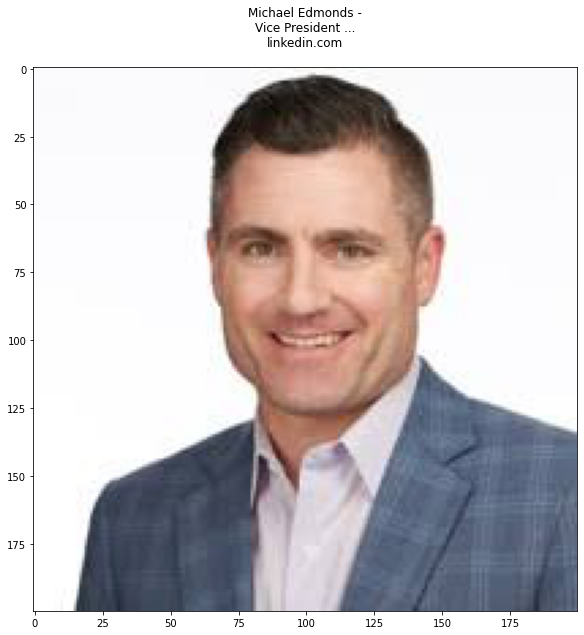

----------------------

 Michael Edmonds
HCHYX US equity
https://www.linkedin.com/in/moedmonds
n


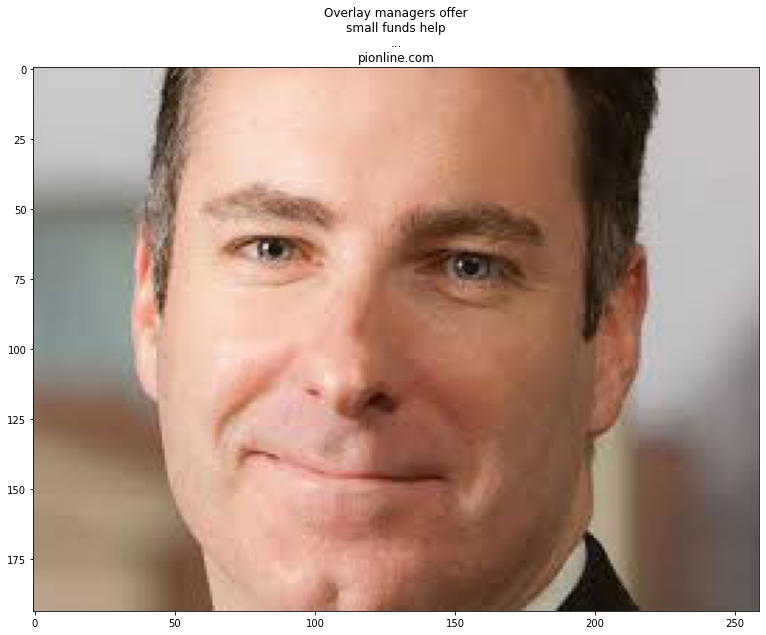

----------------------

 Clint Talmo
HCHYX US equity
https://www.pionline.com/article/20170123/PRINT/301239991/overlay-managers-offer-small-funds-help-on-external-trading
n


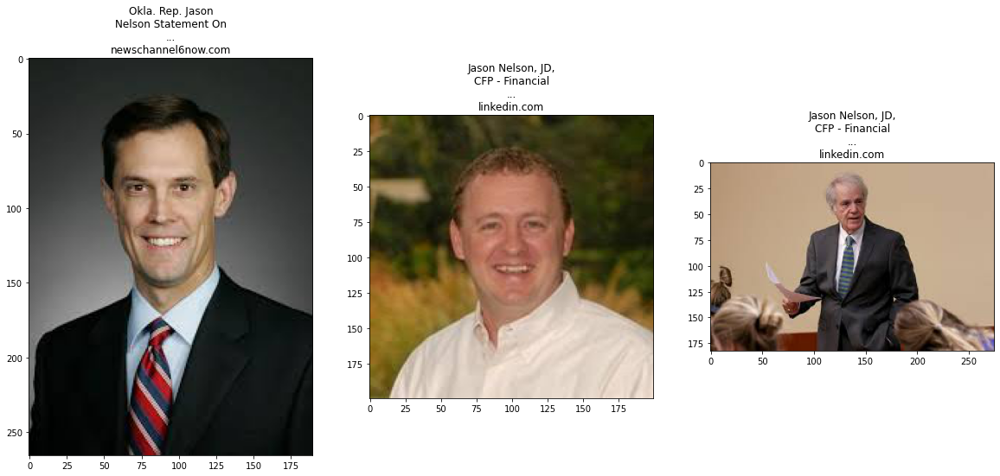

----------------------

 Jason Nelson
HCHYX US equity
https://www.newschannel6now.com/story/18907281/ok-rep-jason-nelson-statement-on-supreme-court-health-care-ruling
https://www.linkedin.com/in/jason-nelson-jd-cfp-b48438a5
https://www.linkedin.com/in/jason-nelson-jd-cfp-b48438a5
n


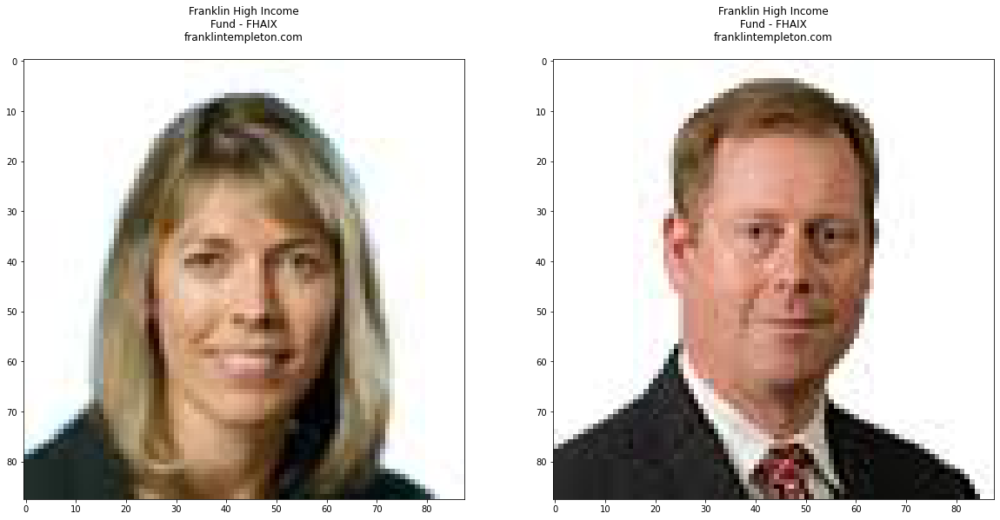

----------------------

 James McGiveran
FHAIX US equity
https://www.franklintempleton.com/investor/investments-and-solutions/investment-options/mutual-funds/overview/105/franklin-high-income-fund/FHAIX
https://www.franklintempleton.com/investor/investments-and-solutions/investment-options/mutual-funds/overview/105/franklin-high-income-fund/FHAIX
n


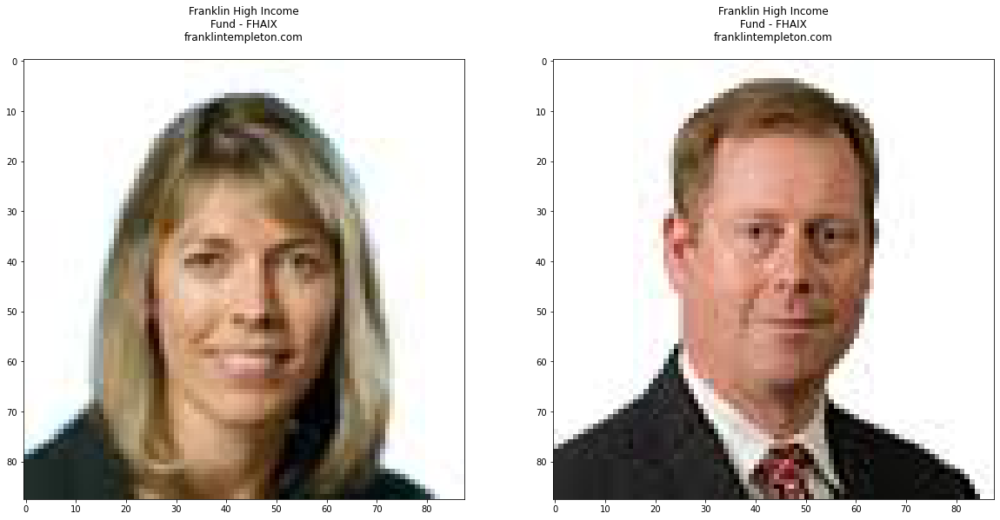

----------------------

 Bryant Dieffenbacher
FHAIX US equity
https://www.franklintempleton.com/investor/investments-and-solutions/investment-options/mutual-funds/overview/105/franklin-high-income-fund/FHAIX
https://www.franklintempleton.com/investor/investments-and-solutions/investment-options/mutual-funds/overview/105/franklin-high-income-fund/FHAIX
n


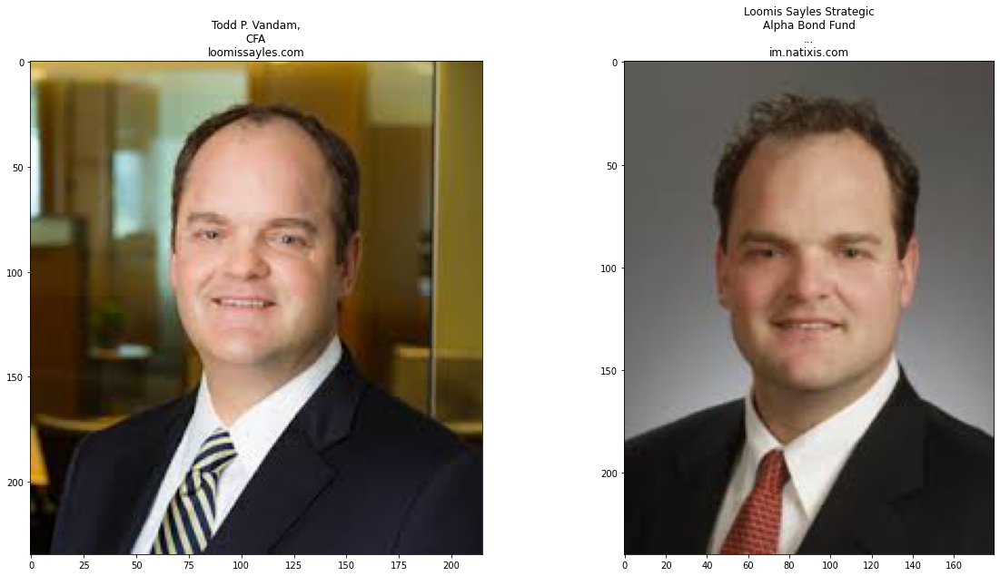

----------------------

 Todd P Vandam
LSIOX US equity
https://www.loomissayles.com/internet/internetdata.nsf/%28BiosByAlias%29/Todd%20Vandam/$FILE/ToddVandam.pdf
https://www.im.natixis.com/latam/funds/loomis-sayles-strategic-alpha-bond-fund/lu0556613759
s1
1


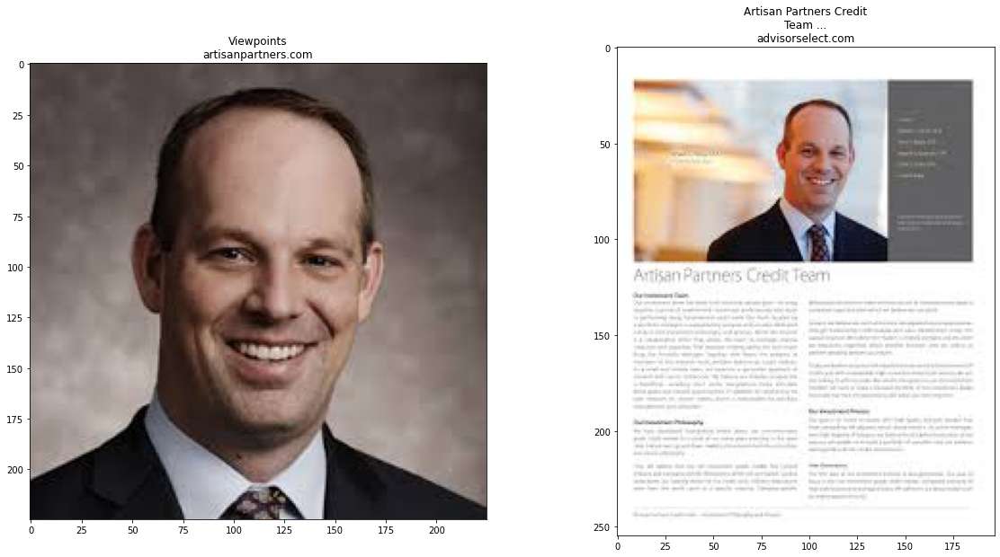

----------------------

 Bryan C Krug
APDFX US equity
https://www.artisanpartners.com/content/dam/documents/pm-viewpoints/vr/Viewpoints-Investor-Update-with-Bryan-Krug-vR.pdf
https://www.advisorselect.com/transcript/artisan-partners-credit-team-investment-philosophy-and-process/artisan-partners-credit-team-investment-philosophy-and-process
s1
1


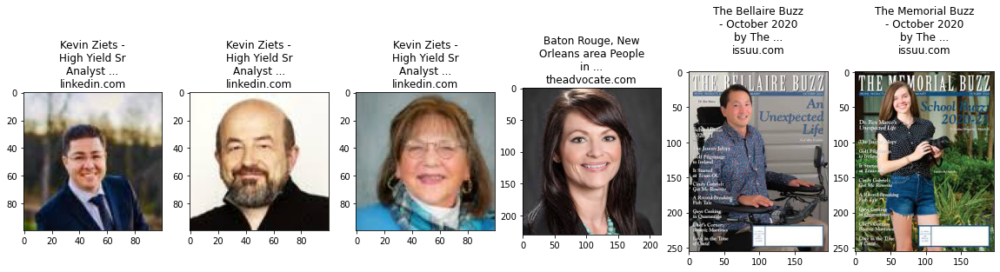

----------------------

 Kevin Ziets
MZHSX US equity
https://www.linkedin.com/in/kevin-ziets-59b43248
https://www.linkedin.com/in/kevin-ziets-59b43248
https://www.linkedin.com/in/kevin-ziets-59b43248
https://www.theadvocate.com/baton_rouge/news/business/article_ffb49baa-c2dd-11ea-954a-5fd878d56e3b.html
https://issuu.com/thebuzzmagazines/docs/buzz_bell_oct20
https://issuu.com/thebuzzmagazines/docs/buzz_mem_oct20
n


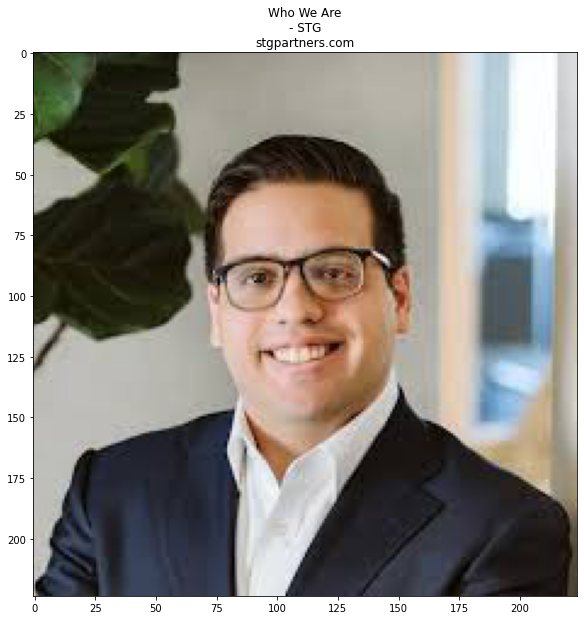

----------------------

 Bryan Petermann
MZHSX US equity
https://stgpartners.com/who-we-are/
n


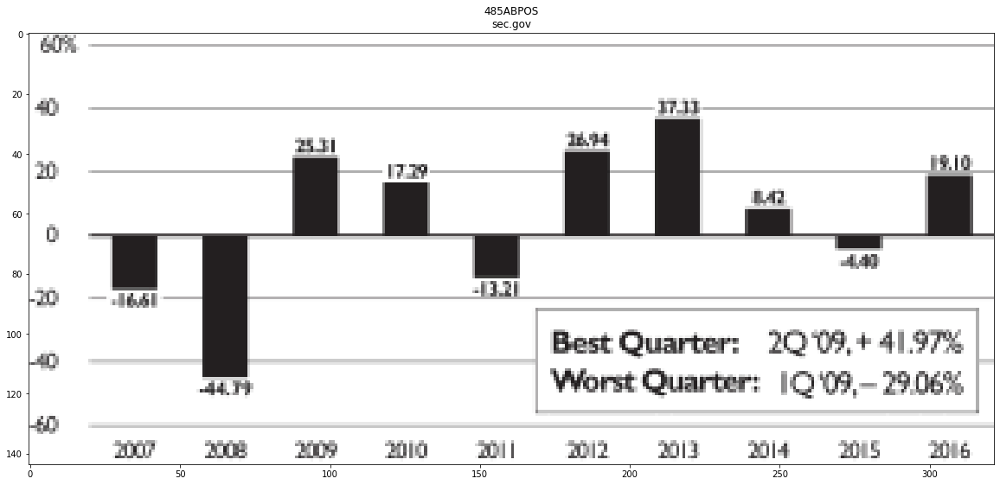

----------------------

 William P Zox "Bill"
DHHAX US equity
https://www.sec.gov/Archives/edgar/data/1032423/000119312517065278/d356565d485apos.htm
n


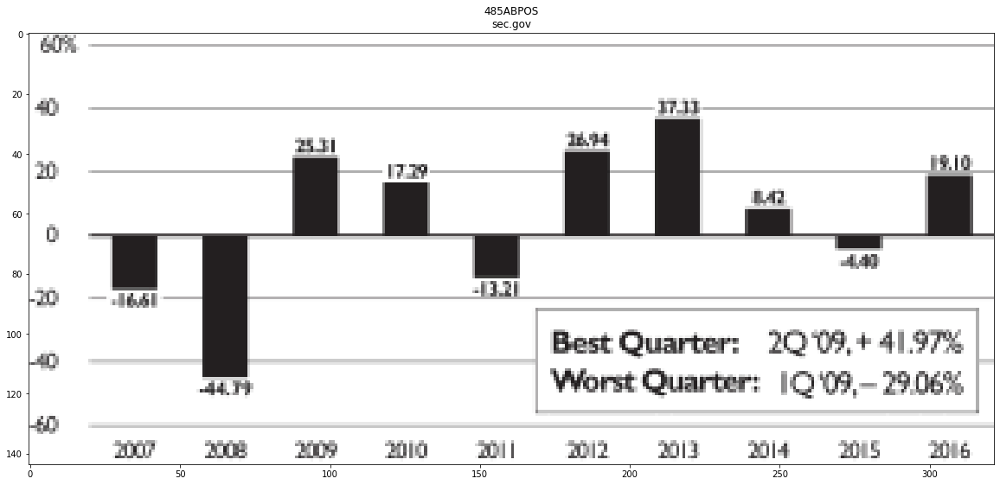

----------------------

 Suken Patel
DHHAX US equity
https://www.sec.gov/Archives/edgar/data/1032423/000119312517065278/d356565d485apos.htm
n


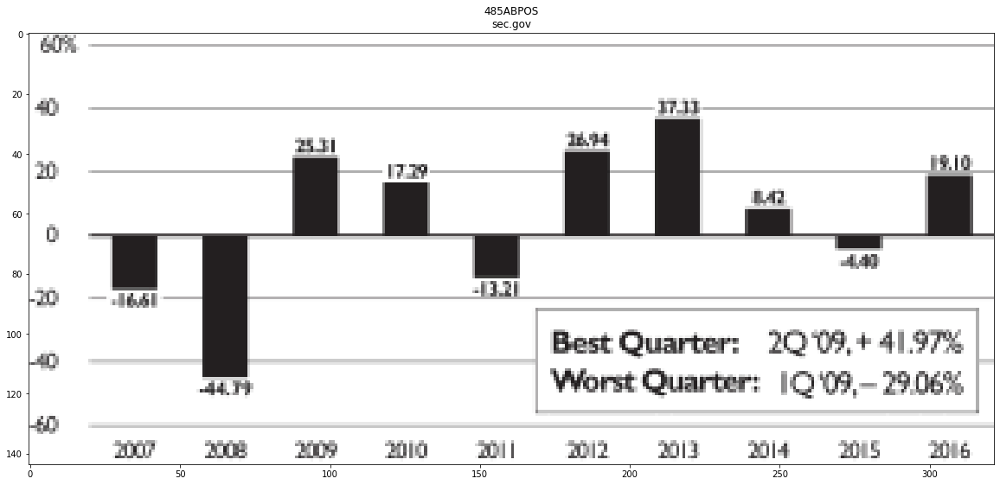

----------------------

 John McClain
DHHAX US equity
https://www.sec.gov/Archives/edgar/data/1032423/000119312517065278/d356565d485apos.htm
n


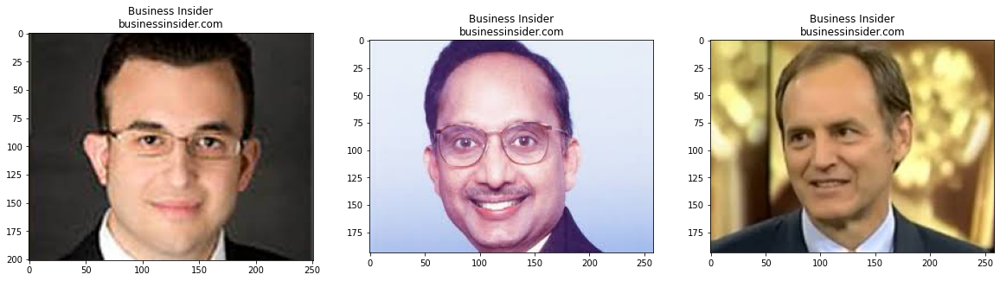

----------------------

 Paul Brigandi
DXHYX US equity
https://www.businessinsider.com/the-worst-mutual-fund-managers-of-2010-2011-1
https://www.businessinsider.com/the-worst-mutual-fund-managers-of-2010-2011-1
https://www.businessinsider.com/the-worst-mutual-fund-managers-of-2010-2011-1
s1
1


/Users/jsusser/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 29790 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/jsusser/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 22763 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/jsusser/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 29790 missing from current font.
  font.set_text(s, 0, flags=flags)
/Users/jsusser/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 22763 missing from current font.
  font.set_text(s, 0, flags=flags)


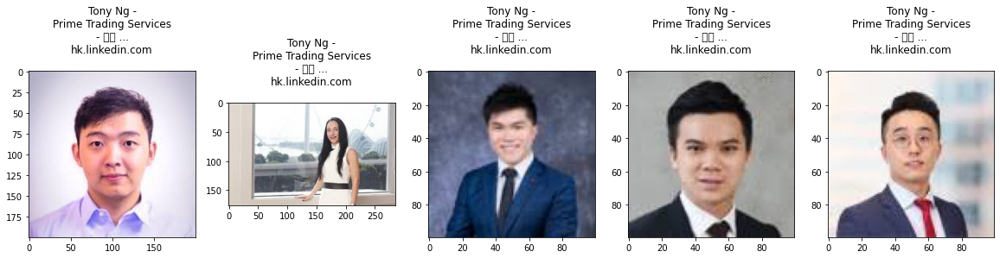

----------------------

 Tony Ng
DXHYX US equity
https://hk.linkedin.com/in/tony-ng-96491b9b
https://hk.linkedin.com/in/tony-ng-96491b9b
https://hk.linkedin.com/in/tony-ng-96491b9b
https://hk.linkedin.com/in/tony-ng-96491b9b
https://hk.linkedin.com/in/tony-ng-96491b9b
n


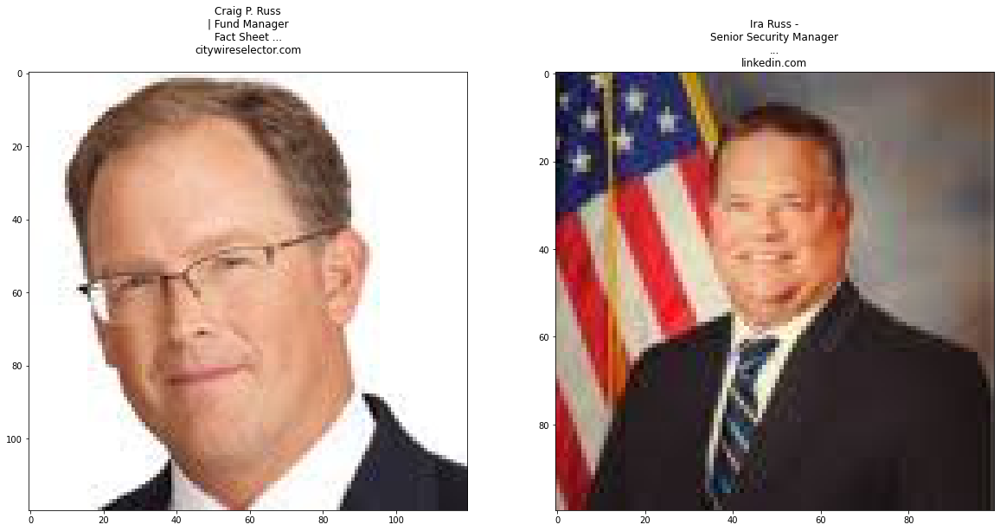

----------------------

 Craig P Russ
IAIRX US equity
https://citywireselector.com/manager/craig-p-russ/d20420
https://www.linkedin.com/in/ira-russ
k


In [7]:
## import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
#remove = pd.DataFrame({}, columns=["name","ticker", "manager"])
#link = pd.DataFrame({}, columns=["name","ticker", "manager", "link"])
done = []
for x in os.listdir("/Users/jsusser/desktop/final_managers"):
    if x != ".DS_Store":
        done += [y for y in os.listdir("/Users/jsusser/desktop/final_managers/%s"%x)]
    
for manager in check["manager"].unique():
    ticker = df[df["Manager"]==manager]["Ticker"].values[0]
    name = instance = df[df["Manager"]==manager]["Name_x"]
    if "%s.jpg" % manager in done or len(none[none["manager"]==manager]) > 0:
        continue
    plt.figure(figsize=(20,10))
    k = 0
    for index, instance in check[check["manager"]==manager][:10].iterrows():
        try:
            plt.subplot(1,len(check[check["manager"]==manager]),k+1)
            img=mpimg.imread(instance["img"])
            imgplot=plt.imshow(img)
            plt.title(split(instance["href_text"]))
        except FileNotFoundError:
            continue
        k += 1
    hrefs = check[check["manager"]==manager]['href'].values
    plt.show()
    print("----------------------\n\n",manager)
    print(ticker)
    for x in hrefs[:10]: print(x)
    
    if not ticker in os.listdir("/Users/jsusser/Desktop/final_managers/"):
        os.mkdir("/Users/jsusser/Desktop/final_managers/{}".format(ticker))
        
    choice = input()
    if choice[0] == "s": 
        link.loc[len(link)] = [name, ticker, manager, hrefs[int(choice[-1])-1]]
        choice = input()
        if choice == "n":
            continue
    if choice == "k": 
        continue
    if choice == "n": 
        none.loc[len(none)] = [name, ticker, manager]
        continue
    if choice == "t": 
        remove.loc[len(remove)] = [name, ticker, manager]
        continue
    if choice == "q": 
        break
   
    img=cv2.imread(np.array(check[check["manager"]==manager]['img']).tolist()[int(choice)-1])
    cv2.imwrite("/Users/jsusser/Desktop/final_managers/%s/%s.jpg" % (ticker,manager), img)
    
    
    


In [ ]:
Kenneth Kozlowski
TNHAX US equity

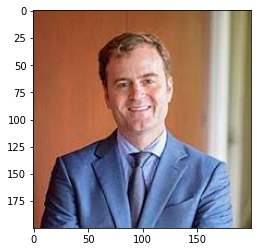

7
['Alexander Hancock "Alex".jpg', '7']


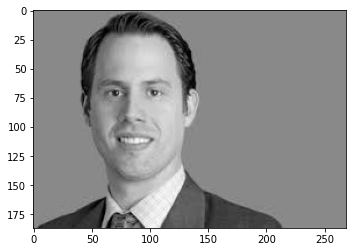

4
['Matt Sheridan.jpg', '4']


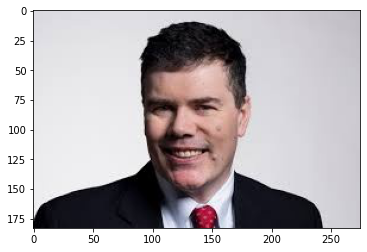

9
['Nicholas Sarchese.jpg', '9']


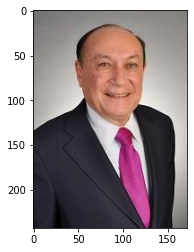

6
['Mark R Shenkman.jpg', '6']


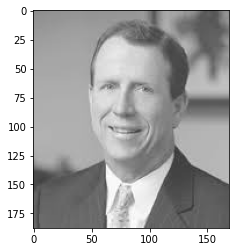

8
['Mark F Travis.jpg', '8']


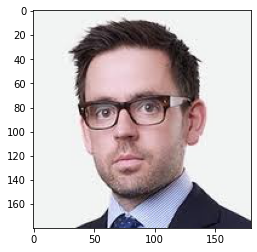

2
['Justin Jewell.jpg', '2']


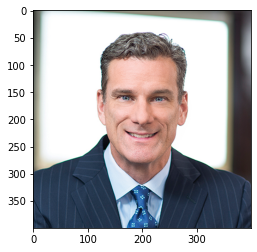

9
['Sean Feeley.jpg', '9']


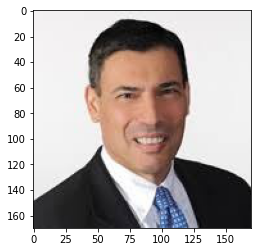

9
['Joseph Portera.jpg', '9']


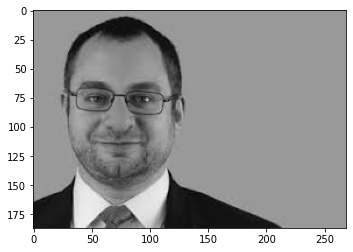

4
['Sherif M Hamid.jpg', '4']


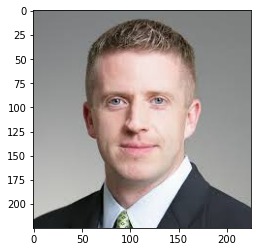

7
['Jeffrey Clarke.jpg', '7']


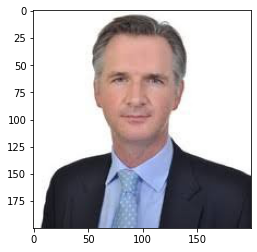

7
['John Pattullo.jpg', '7']


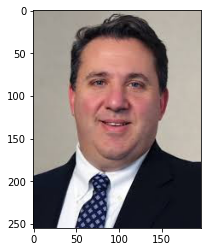

2
['Matt Shulkin.jpg', '2']


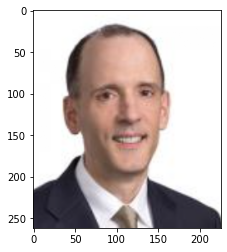

6
['George Goudelias.jpg', '6']


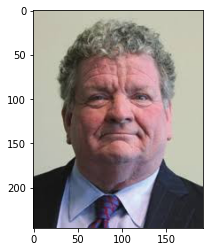

4
['Ken Monaghan.jpg', '4']


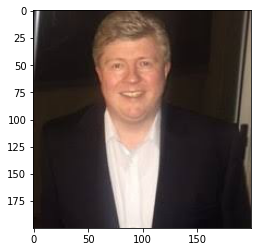

5
['Jeremy Hughes.jpg', '5']


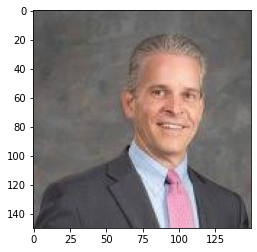

9
['Bruce H Monrad.jpg', '9']


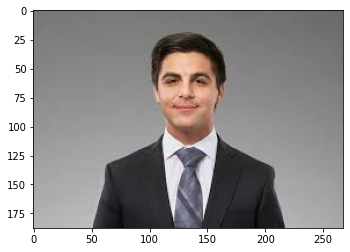

1
['Hunter Hayes.jpg', '1']


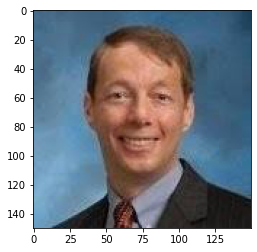

7
['Matt Freund.jpg', '7']


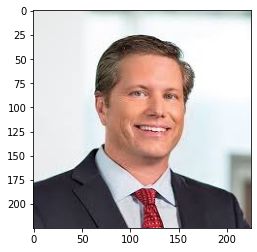

9
['Scott Roth.jpg', '9']


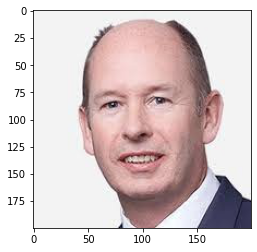

7
['Mark Dowding.jpg', '7']


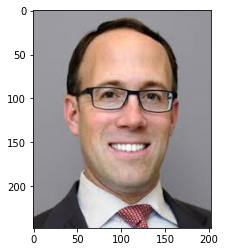

8
['Matthew W Ryan.jpg', '8']


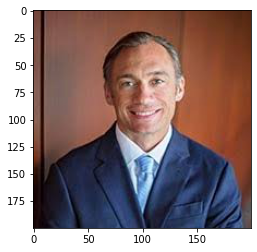

8
['Paul Dlugosch.jpg', '8']


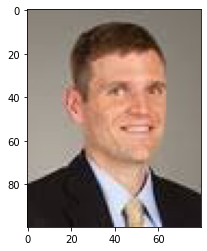

7
['Brett S Kozlowski.jpg', '7']


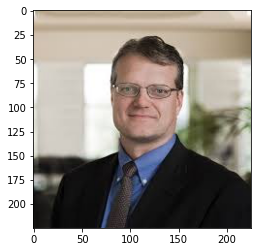

9
['Ryan Kelly.jpg', '9']


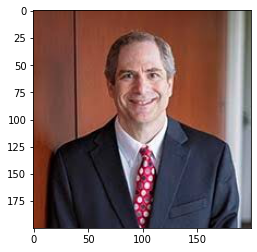

4
['Jeff Sitzmann.jpg', '4']


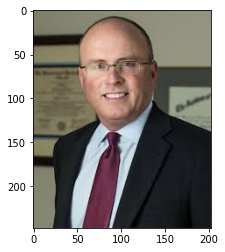

3
['Brian Clapp.jpg', '3']


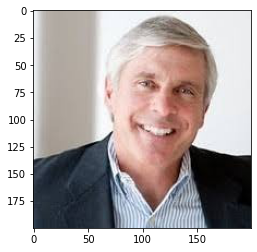

7
['David Cole.jpg', '7']


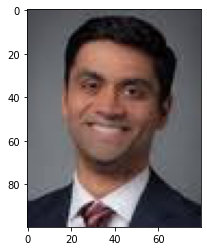

2
['Jatin Misra.jpg', '2']


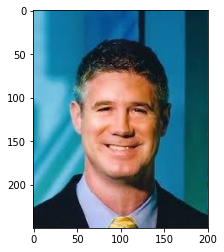

6
['Bill Housey.jpg', '6']


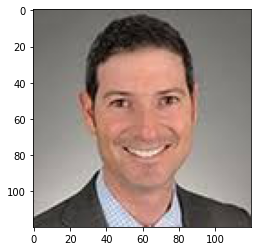

7
['Justin W Slatky.jpg', '7']


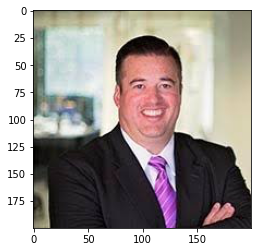

9
['Jeff Deardorff.jpg', '9']


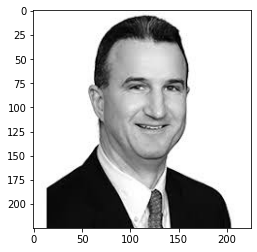

5
['John P McCarthy.jpg', '5']


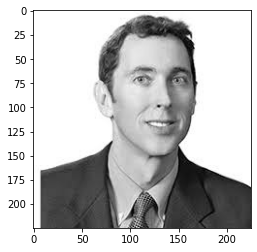

4
['Adam H Brown.jpg', '4']


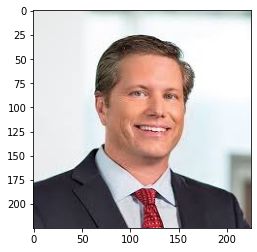

7
['Thomas McDonnell.jpg', '7']


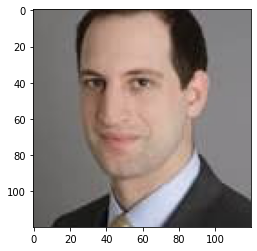

7
['Gershon M Distenfeld.jpg', '7']


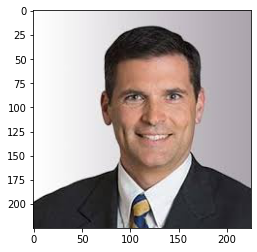

6
['James Dudnick.jpg', '6']


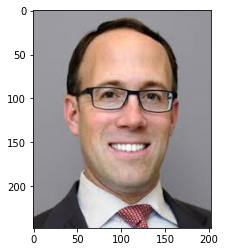

7
['Mike Skatrud.jpg', '7']


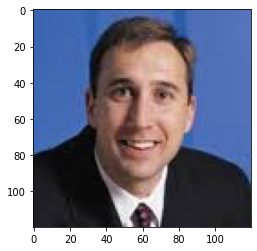

8
['Michael Paul Byrum.jpg', '8']


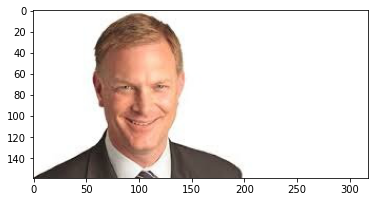

7
['Niklas Nordenfelt.jpg', '7']


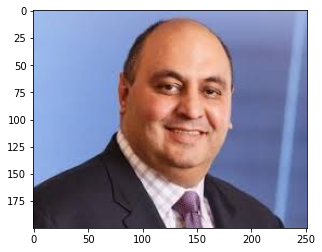

4
['Michael Reed "Mike".jpg', '4']


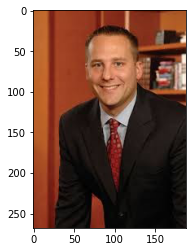

5
['Nicholas Niziolek.jpg', '5']


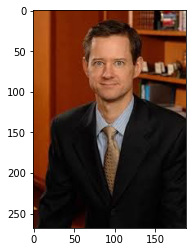

7
['Jon Vacko.jpg', '7']


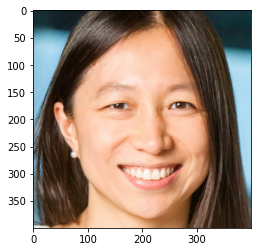

6
['Yan Zhao.jpg', '6']


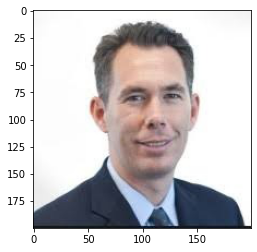

7
['Scott Roberts.jpg', '7']


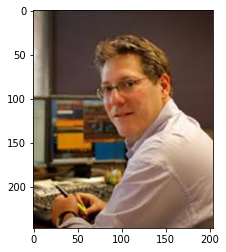

9
['David K Sherman.jpg', '9']


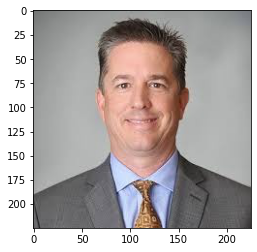

7
['Steven Gish.jpg', '7']


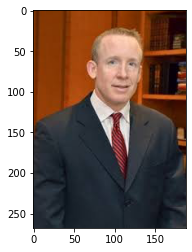

9
['Chuck Carmody.jpg', '9']


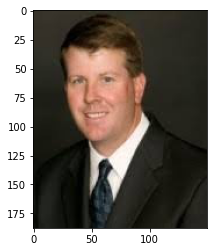

6
['Sandy Rufenacht.jpg', '6']


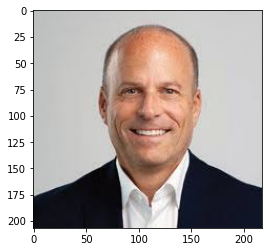

8
['Neil Wechsler.jpg', '8']


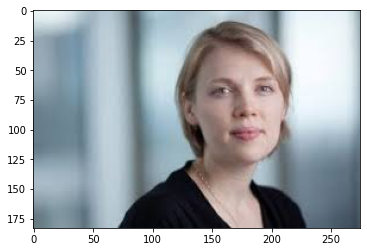

2
['Jenna Barnard.jpg', '2']


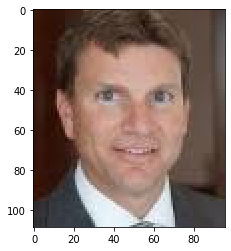

8
['Michael C Buchanan.jpg', '8']


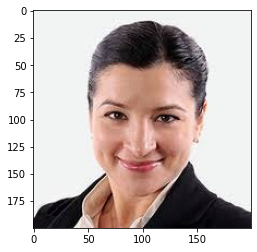

2
['Polina Kurdyavko.jpg', '2']


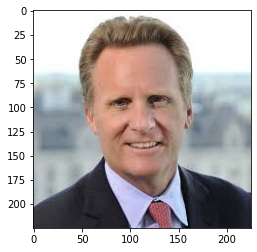

5
['Robert Cignarella.jpg', '5']


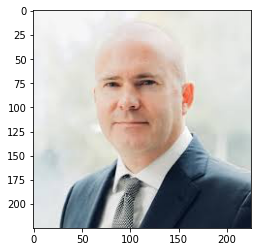

6
['Martin Horne.jpg', '6']


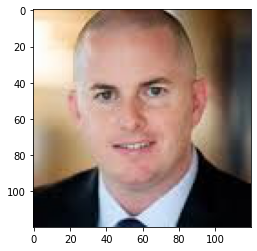

7
['Walter E Kilcullen.jpg', '7']


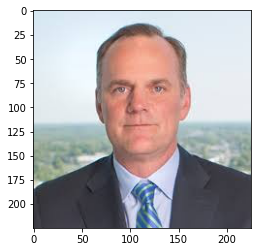

9
['David Mihalick.jpg', '9']


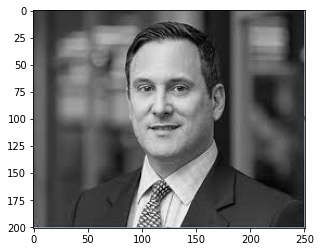

8
['Robert Gutmann.jpg', '8']


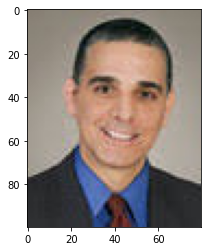

7
['Michael V Salm.jpg', '7']


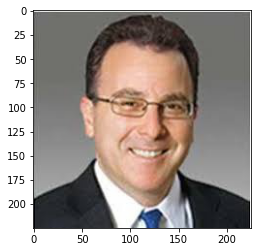

8
['Andrew Susser.jpg', '8']


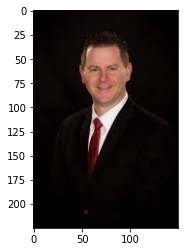

7
['David M Battilega.jpg', '7']


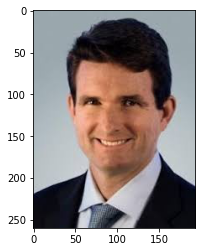

6
['Douglas G Forsyth.jpg', '6']


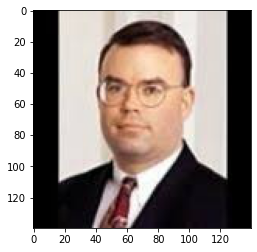

4
['Todd Bruce Johnson.jpg', '4']


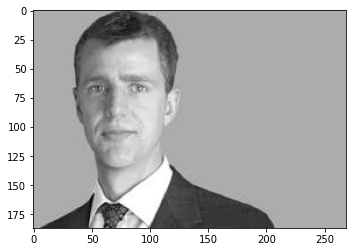

5
['Ivan Rudolph-Shabinsky.jpg', '5']


In [11]:
scores = {}
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
#tf = pd.read_csv("scores2.csv", index_col=0)
tf = pd.DataFrame(columns=["names", "score"])
for x in os.listdir("/Users/jsusser/Desktop/final_managers"):
    #if len(tf[x.split('.jpg')[0] == tf["names"]]) > 0:
        
    if x == ".DS_Store":
        continue
    img=mpimg.imread("/Users/jsusser/Desktop/final_managers/%s" % x)
    imgplot=plt.imshow(img)
    plt.show()
    score = input()
    if score == "q":
        break
    print([x, score])
    tf.loc[len(tf)] = [x.split('.jpg')[0], score]
    scores[x] = score


In [83]:
lf = pd.read_csv("returns-managers.csv", index_col=0)

In [84]:
#names = [x.split(".jpg")[0] for x in scores.keys()]

#tf = pd.DataFrame({"names":names, "score": scores.values()})
#tf.to_csv("scores6.csv")

In [85]:
tf = pd.read_csv("scores2.csv", index_col=0)

In [86]:
kf = pd.merge(lf, tf, left_on="3", right_on="names", how="inner")
kf["3yr"] = abs(kf["3yr"])
kf[kf["Ticker"]=="PBHAX US equity"]

,Name,Ticker,3yr,3,names,score
50,PGIM High Yield Fund,PBHAX US equity,19.45022,Ryan Kelly,Ryan Kelly,9
52,PGIM High Yield Fund,PBHAX US equity,19.45022,Robert Cignarella,Robert Cignarella,10
54,PGIM High Yield Fund,PBHAX US equity,19.45022,Brian Clapp,Brian Clapp,7


In [87]:
def find(name):
    for x in ["Inverse", "Short", "Tactical", "Low", "Limited", "Risk", "Mortgage", "Floating"]:
        if x in name:
            return False
    return True

kf = kf[kf["Name"].apply(find)]

In [90]:
kf["score"] = kf["score"].astype('float')
kf = kf.rename(columns={"3yr": "return", "B": "c"})
kf["return"] = kf["return"].astype('float')
kf = kf.sort_values(by="score")
kf = kf.groupby(by=['Ticker']).agg({"score":"mean", "return":"first", "Name": "first"})
kf.to_csv("kf.csv")
kf

,score,return,Name
Ticker,,,
AGDAX US equity,5.000000,9.729970,AB High Income Fund Inc
AMHYX US equity,7.666667,12.184440,Invesco High Yield Fund
ATIPX US equity,7.500000,13.298280,Aquila Three Peaks High Income Fund
BXIAX US equity,9.000000,9.730181,Barings Global Credit Income Opportunities Fund
CCHYX US equity,5.600000,11.754410,Calamos High Income Fund
DHOAX US equity,2.000000,17.618270,Delaware High-Yield Opportunities Fund
DPHYX US equity,5.500000,17.646670,Macquarie High Yield Bond Portfolio
FIFIX US equity,5.500000,13.642550,Delaware Fund For Income Fund
FYAIX US equity,3.000000,11.193380,Access Flex High Yield Fund


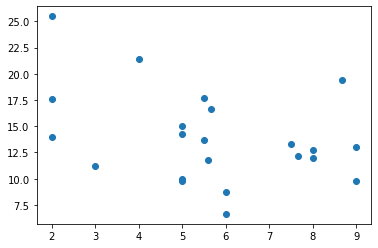

In [92]:
plt.plot(kf["score"],kf["return"], "o")

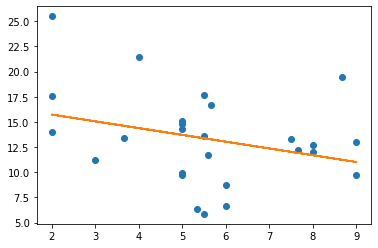

In [47]:
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import numpy as np

temperature = np.array(kf["score"])
temperature = temperature.reshape(-1, 1)
sales = np.array(kf["return"])

plt.plot(temperature, sales, 'o')

line_fitter = LinearRegression()
line_fitter.fit(temperature, sales)
sales_predict = line_fitter.predict(temperature)

plt.plot(temperature, sales_predict)
plt.show()

In [65]:
from sklearn.metrics import r2_score
print("Test score:")
r2_score(sales, sales_predict)

Test score:


0.09154089407848165

In [99]:

kf.to_csv("kf.csv")

In [21]:
#kf["return"].value_counts()
dirr = [x.split(".jpg")[0] for x in os.listdir("/Users/jsusser/desktop/final_managers")]
#pred = [x[0] for x in pred]
df = pd.DataFrame({"names": dirr, "score": pred})
df

,names,score
0,"Alexander Hancock ""Alex""",1.546767
1,Matt Sheridan,2.264159
2,Nicholas Sarchese,2.612245
3,Mark R Shenkman,1.456823
4,Mark F Travis,2.151882
...,...,...
58,Andrew Susser,2.772708
59,David M Battilega,1.281628
60,Douglas G Forsyth,2.269377
61,Todd Bruce Johnson,2.207786


In [18]:
pred = [[1.5467674],
       [2.2641585],
       [2.6122448],
       [1.4568226],
       [2.1518822],
       [3.3526187],
       [2.3348992],
       [2.9024842],
       [1.7406093],
       [2.8499656],
       [2.572432 ],
       [2.2875247],
       [2.8412282],
       [1.6991736],
       [1.9582273],
       [2.4361289],
       [1.4714198],
       [2.022859 ],
       [2.6804657],
       [3.0752635],
       [2.9160876],
       [1.2345506],
       [2.3328426],
       [1.5270739],
       [1.478362 ],
       [1.5300711],
       [2.451001 ],
       [1.9558686],
       [2.713425 ],
       [2.792785 ],
       [2.225312 ],
       [3.0389352],
       [2.840967 ],
       [2.6804657],
       [2.374637 ],
       [2.8560903],
       [2.9160876],
       [2.476189 ],
       [2.0604067],
       [2.3011887],
       [1.3855056],
       [1.2525213],
       [2.60005  ],
       [2.9668243],
       [1.3907064],
       [2.454692 ],
       [1.0619923],
       [2.0436487],
       [2.513237 ],
       [2.3223536],
       [2.400427 ],
       [3.6681082],
       [2.2996056],
       [2.1722825],
       [2.8051836],
       [2.116833 ],
       [2.3920012],
       [2.4678452],
       [2.7727077],
       [1.2816284],
       [2.269377 ],
       [2.207786 ],
       [2.224809 ]]